## Download ArXiv Articles: Computation and Language

In [1]:
from datasets import load_dataset

# Load data from huggingface
dataset = load_dataset('MaartenGr/arxiv_nlp')

# Extract metadata
abstracts = dataset['train']['Abstracts']
titles = dataset['train']['Titles']

## Pipeline for Text Clustering

### 1. Embedding Documents

In [2]:
from sentence_transformers import SentenceTransformer

embedding_model  = SentenceTransformer('thenlper/gte-small')

In [3]:
embeddings = embedding_model.encode(abstracts, show_progress_bar=True)

Batches:   0%|          | 0/1405 [00:00<?, ?it/s]

In [4]:
embeddings.shape

(44949, 384)

### 2- Reducing the Dimensionality of Embeddings

In [5]:
from umap import UMAP

# Reduce the input embeddings from 384 dimenstions to 5 dimenstions
umap_model = UMAP(n_components=5, min_dist=0.0, metric='cosine', random_state=42)
reduced_embeddings = umap_model.fit_transform(embeddings)

C:\Users\Zeeshan\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


### 3- Cluster the Reduced Embeddings

In [6]:
from hdbscan import HDBSCAN

# Fit the model and extract the clusters
hdbscan_model = HDBSCAN(min_cluster_size=50, metric='euclidean', cluster_selection_method='eom')
hdbscan_model.fit(reduced_embeddings)
clusters = hdbscan_model.labels_

In [7]:
len(set(clusters))

150

In [34]:
from bertopic import BERTopic

# Train the model with previously defined models
topic_model = BERTopic(embedding_model=embedding_model, umap_model=umap_model, hdbscan_model=hdbscan_model, verbose=True)
topic_model.fit(abstracts, embeddings)

2024-12-17 16:19:36,064 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-17 16:20:10,487 - BERTopic - Dimensionality - Completed ✓
2024-12-17 16:20:10,488 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-17 16:20:12,381 - BERTopic - Cluster - Completed ✓
2024-12-17 16:20:12,390 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-17 16:20:15,935 - BERTopic - Representation - Completed ✓


In [35]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,13888,-1_of_the_and_to,"[of, the, and, to, in, we, language, that, for...",[ Word Representations form the core componen...
1,0,2266,0_question_questions_answer_qa,"[question, questions, answer, qa, answering, a...",[ While models have reached superhuman perfor...
2,1,2127,1_speech_asr_recognition_end,"[speech, asr, recognition, end, acoustic, spea...","[ Voice Assistants such as Alexa, Siri, and G..."
3,2,1537,2_medical_clinical_biomedical_patient,"[medical, clinical, biomedical, patient, healt...",[ Biomedical Named Entity Recognition (NER) i...
4,3,916,3_translation_nmt_machine_bleu,"[translation, nmt, machine, bleu, neural, engl...",[ Neural machine translation (NMT) becomes a ...
...,...,...,...,...,...
145,144,53,144_temporal_events_event_relations,"[temporal, events, event, relations, relation,...",[ Temporal relation extraction models have th...
146,145,52,145_prompt_prompts_optimization_prompting,"[prompt, prompts, optimization, prompting, llm...",[ Prompt optimization aims to find the best p...
147,146,52,146_rumor_rumour_rumors_rumours,"[rumor, rumour, rumors, rumours, stance, verac...",[ The rapid development of social media chang...
148,147,51,147_moe_experts_mixture_routing,"[moe, experts, mixture, routing, expert, spars...",[ The Mixture of Experts (MoE) models are an ...


In [36]:
topic_model.get_topic(12)

[('image', 0.03405167327400637),
 ('visual', 0.023762355076535915),
 ('vision', 0.017707170831410653),
 ('captioning', 0.015667832460653026),
 ('multimodal', 0.01529964736250454),
 ('captions', 0.015226918095535532),
 ('images', 0.014964309991768766),
 ('modal', 0.014916152169199401),
 ('caption', 0.012863138844378848),
 ('language', 0.008860956822272984)]

In [37]:
topic_model.find_topics("attention")

([25, -1, 44, 71, 77], [0.857798, 0.848456, 0.8442376, 0.84312016, 0.8419538])

In [18]:
topic_model.get_topic(22)

[('topic', 0.06851274193907336),
 ('topics', 0.035606499739202255),
 ('lda', 0.016252499997749102),
 ('latent', 0.013294352349875926),
 ('documents', 0.012902089519071128),
 ('document', 0.012760896760789632),
 ('modeling', 0.012114281213349246),
 ('dirichlet', 0.009343568245833047),
 ('word', 0.008624550135855147),
 ('allocation', 0.007526477417909863)]

In [136]:
topic_model.topics_[titles.index('Attention Is All You Need')]

3

In [129]:
# Reduce the input embeddings from 384 dimenstions to 2 dimenstions
umap_model = UMAP(n_components=2, min_dist=0.0, metric='cosine', random_state=42)
reduced_embeddings = umap_model.fit_transform(embeddings)

## Visualizations

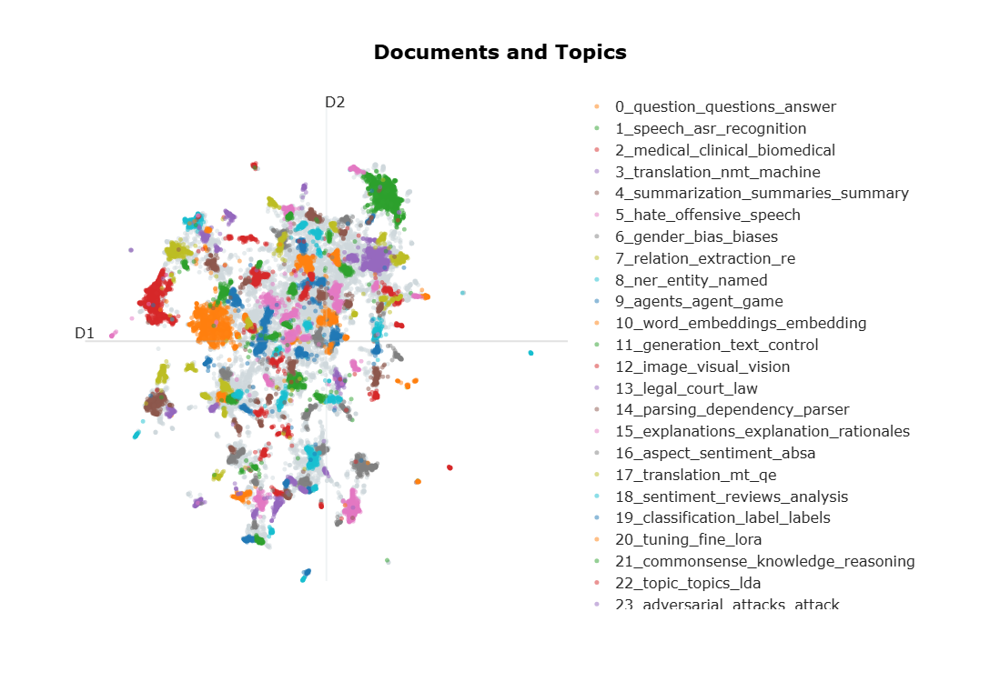

In [130]:
# Visualize topics and documents
fig = topic_model.visualize_documents(
    titles,
    reduced_embeddings=reduced_embeddings,
    width=1200,
    hide_annotations=True
)

# Update fonts of legend for easier visualization
fig.update_layout(font=dict(size=16))

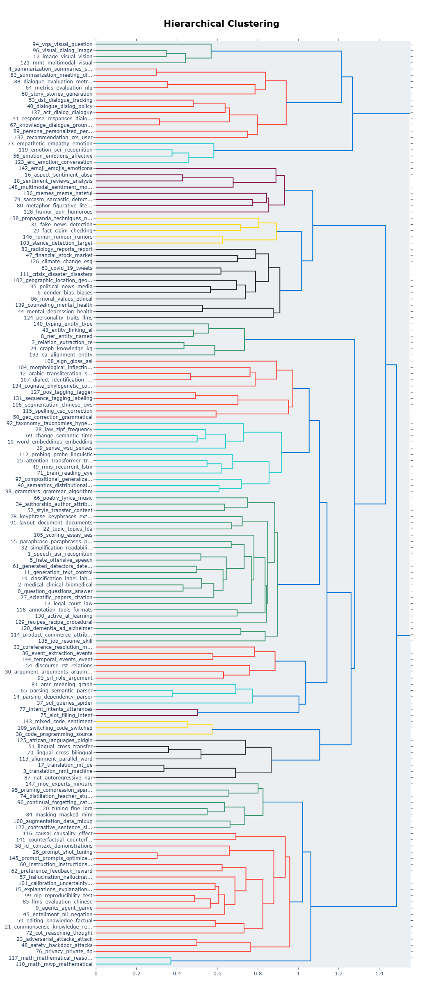

In [131]:
# Visualize barchart with ranked keywords
# topic_model.visualize_barchart()

# Visualize relationships between topics
# topic_model.visualize_heatmap(n_clusters=30)

# Visualize the potential hierarchical structure of topics
topic_model.visualize_hierarchy()

## Representation Models

In [40]:
# Save original representations
from copy import deepcopy
original_topics = deepcopy(topic_model.topic_representations_)

In [49]:
def topic_differences(model, original_topics, nr_topics=5):
    """Show the differences in topic representations between two models """
    df = pd.DataFrame(columns=["Topic", "Original", "Updated"])
    for topic in range(nr_topics):
    
        # Extract top 5 words per topic per model
        og_words = " | ".join(list(zip(*original_topics[topic]))[0][:5])
        new_words = " | ".join(list(zip(*model.get_topic(topic)))[0][:5])
        df.loc[len(df)] = [topic, og_words, new_words]
    
    return df

## KeyBERTInspired

In [42]:
import pandas as pd
from bertopic.representation import KeyBERTInspired

# Update our topic representations using KeyBERTInspired
representation_model = KeyBERTInspired()
topic_model.update_topics(abstracts, representation_model=representation_model)

In [50]:
# Show topic differences
topic_differences(topic_model, original_topics)

,Topic,Original,Updated
0,0,question | questions | answer | qa | answering,answering | questions | comprehension | questi...
1,1,speech | asr | recognition | end | acoustic,phonetic | language | speech | transcription |...
2,2,medical | clinical | biomedical | patient | he...,nlp | language | clinical | corpus | ehr
3,3,translation | nmt | machine | bleu | neural,translation | translate | translated | transla...
4,4,summarization | summaries | summary | abstract...,summarization | summarizers | summaries | summ...


## Maximal Marginal Relevance

In [60]:
from bertopic.representation import MaximalMarginalRelevance

# Update our topic representations using MaximalMarginalRelevance
representation_model = MaximalMarginalRelevance(diversity=0.5)
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

,Topic,Original,Updated
0,0,question | questions | answer | qa | answering,questions | retrieval | comprehension | knowle...
1,1,speech | asr | recognition | end | acoustic,speech | asr | error | model | training
2,2,medical | clinical | biomedical | patient | he...,biomedical | patient | healthcare | extraction...
3,3,translation | nmt | machine | bleu | neural,translation | nmt | bleu | neural | parallel
4,4,summarization | summaries | summary | abstract...,summarization | document | extractive | rouge ...


## Flan-T5

In [86]:
from transformers import pipeline
from bertopic.representation import TextGeneration

prompt = """I have a topic that contains the following documents:

[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the information above, extract a short topic lable in the following format:
topic: <short topic lable>

"""

# Update our topic representations using Flan-T5
generator = pipeline('text2text-generation', model='google/flan-t5-small', device="cuda:0")
representation_model = TextGeneration(generator, prompt=prompt, doc_length=50, tokenizer='whitespace')
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

100%|████████████████████████████████████████████████████████████████████████████████| 150/150 [00:33<00:00,  4.50it/s]


,Topic,Original,Updated
0,0,question | questions | answer | qa | answering,question answering: learning comprehension from QA datasets | | | |
1,1,speech | asr | recognition | end | acoustic,automatic speech recognition for Frisian-Dutch code-switching | | | |
2,2,medical | clinical | biomedical | patient | health,Biomedical Named Entity Recognition: NER | | | |
3,3,translation | nmt | machine | bleu | neural,attention-based neural machine translation | | | |
4,4,summarization | summaries | summary | abstractive | document,abstractive summarization: abstractive text summarization | | | |


## OpenAI

In [69]:
from bertopic.representation import OpenAI
import openai

pd.set_option('display.max_colwidth', None)

prompt = """I have a topic that contains the following documents:

[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the information above, extract a short topic lable in the following format:
topic: <short topic lable>

"""

# Update our topic representations using OpenAI
client = openai.OpenAI(api_key='')
representation_model = OpenAI(client, model='gpt-4o-mini', exponential_backoff=True, chat=True, prompt=prompt)
topic_model.update_topics(abstracts, representation_model=representation_model)

100%|████████████████████████████████████████████████████████████████████████████████| 150/150 [02:37<00:00,  1.05s/it]


,Topic,Original,Updated
0,0,question | questions | answer | qa | answering,Multi-Hop Question Answering and Generation
1,1,speech | asr | recognition | end | acoustic,End-to-End Speech Recognition and Translation ...
2,2,medical | clinical | biomedical | patient | he...,Clinical NLP and Biomedical Entity Extraction ...
3,3,translation | nmt | machine | bleu | neural,Hybrid Neural Machine Translation Improvements
4,4,summarization | summaries | summary | abstract...,Abstractive Text Summarization Techniques and ...


In [81]:
topic_differences(topic_model, original_topics, 20)

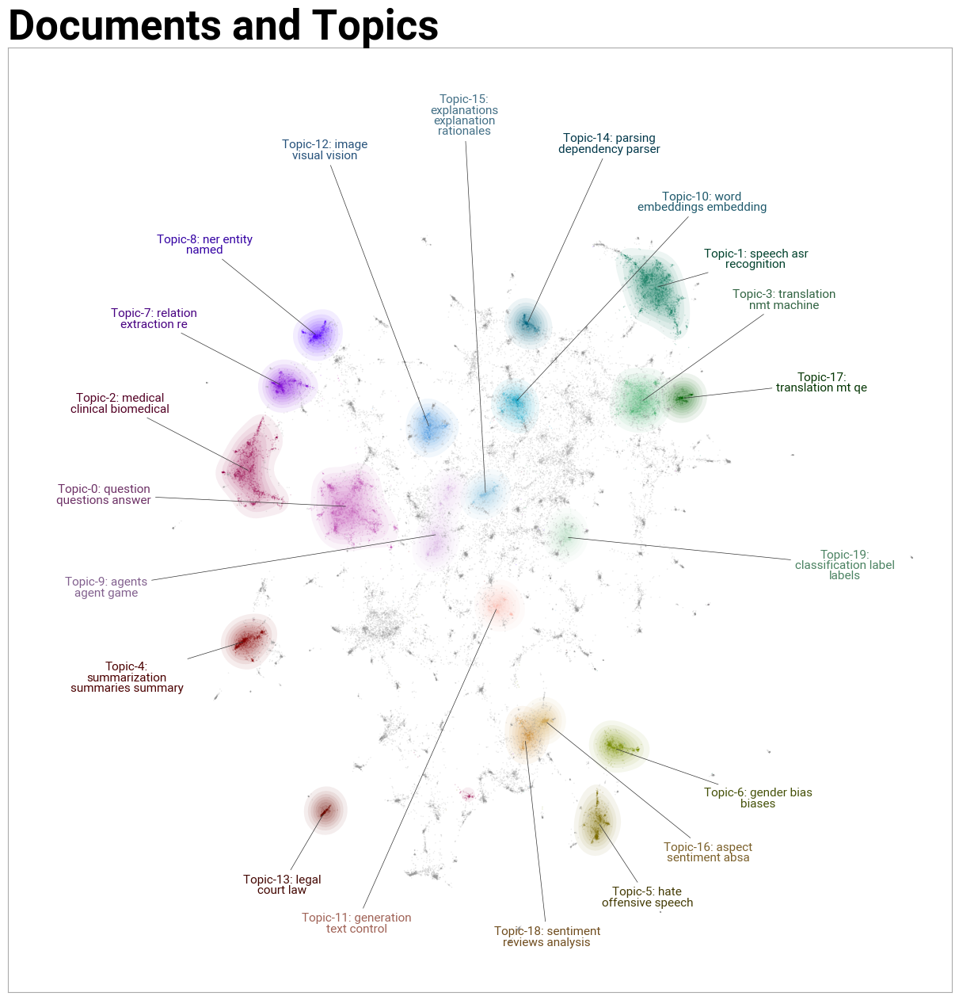

In [128]:
# Visualize topics and documents
fig = topic_model.visualize_document_datamap(
   titles,
    topics=list(range(20)),
    reduced_embeddings=reduced_embeddings,
    width=1200,
    label_font_size=11,
    label_wrap_width=20,
    use_medoids=True,
)
plt.savefig("datamapplot.png", dpi=300)

In [127]:
reduced_embeddings.shape

(44949, 2)

## Word Cloud

In [113]:
topic_model.update_topics(abstracts, top_n_words=500)

2024-12-17 18:45:18,945 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


In [115]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

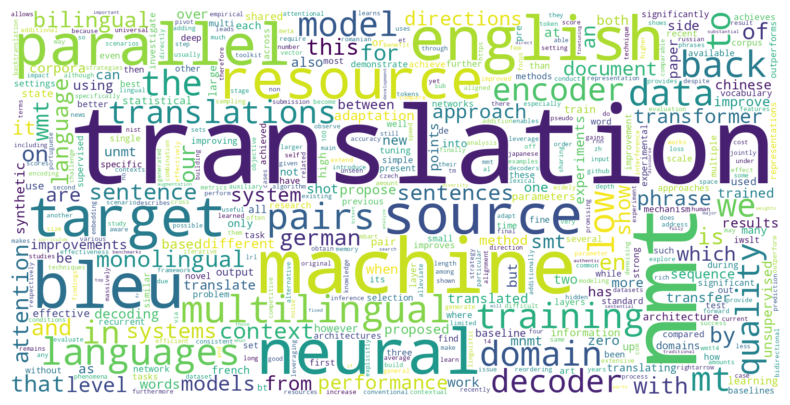

In [135]:
def create_wordcloud(model, topic):
    plt.figure(figsize=(10,5))
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000, width=1600, height=800)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Show wordcloud
create_wordcloud(topic_model, topic=3)